<a href="https://colab.research.google.com/github/MasoudMoeini/Google-Street-View-Images-Blur-Detection/blob/main/SBDN_Expriment2_Shi_DUT_SZU_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
import cv2
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras.models import Sequential, Model,load_model
from keras.optimizers import gradient_descent_v2 
from google.colab.patches import cv2_imshow
from keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D,MaxPool2D
from keras.preprocessing import image
from keras.initializers import glorot_uniform
from keras import regularizers

In [7]:
!unzip -qq BlurDatasetImage.zip

In [1]:
!unzip -qq BlurDatasetGT.zip

In [5]:
gg='out_of_focus0001.png'
gg[:12]

'out_of_focus'

In [91]:
from numpy import *
images_folder= "image/*"
labels_folder = "gt/"
def data_preprocessing(images_folder,labels_folder):
  total_img = []
  labels = []
  files = glob.glob (images_folder)
  for myFile in files:
    image_name=os.path.split(myFile)[1]
    if image_name[:12]=='out_of_focus':
    # image resize
      img = Image.open(myFile)
      img = img.resize((224, 224))
      img = np.asarray(img)
      #if (img.shape!=(224,224,3)):
        #img=np.delete(img, 3)
      total_img.append(img)
      #Gt 
      image_name=image_name[:-3]
      image_name=image_name+'png'
      label = Image.open(labels_folder+image_name)
      label = label.resize((224, 224))
      label = np.asarray(label)
      if (label.shape!=(224,224)):
        label=label[:,:,0]
      labels.append(label)
  total_img = np.array(total_img)
  labels = np.asarray(labels)
  label= np.reshape(labels,[labels.shape[0],labels.shape[1],labels.shape[2]])
  total_img= np.reshape(total_img,[total_img.shape[0],total_img.shape[1],total_img.shape[2],total_img.shape[3]])
  #np.save('Shi704defocus',total_img)
  #np.save('Shi704Gt',label)
  return labels,total_img

In [92]:
CHUK_labels,CHUK_images=data_preprocessing(images_folder,labels_folder)

In [93]:
CHUK_images.shape

(704, 224, 224, 3)

In [94]:
CHUK_labels.shape

(704, 224, 224)

In [95]:
def identity_block(X, f, filters, stage, block):
   
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    F1, F2, F3 = filters

    X_shortcut = X
   
    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2a', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X = Add()([X, X_shortcut])# SKIP Connection
    X = Activation('relu')(X)

    return X

In [96]:
def convolutional_block(X, f, filters, stage, block, s=2):
   
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    F1, F2, F3 = filters

    X_shortcut = X

    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '2a', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X_shortcut = Conv2D(filters=F3, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '1', kernel_initializer=glorot_uniform(seed=0))(X_shortcut)
    X_shortcut = BatchNormalization(axis=3, name=bn_name_base + '1')(X_shortcut)

    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)

    return X

In [97]:
def decoder_network(HLSF):
  # 7*7*2048 is input tensor 
  #decoder 
  dec2 = layers.Conv2DTranspose(2048, (3, 3), strides=2, activation="relu", padding="same")(HLSF) #14*14*2048
  dec3 = layers.Conv2DTranspose(512, (3, 3), strides=2, activation="relu", padding="same")(dec2)#28*28*512
  dec4 = layers.Conv2DTranspose(128, (3, 3), strides=2, activation="relu", padding="same")(dec3)#56*56*128
  dec5 = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(dec4)#112*112*32
  dec6 = layers.Conv2DTranspose(3, (3, 3), strides=2, activation="relu", padding="same")(dec5)#224*224*3
  dec7 = layers.Conv2DTranspose(3, (3, 3), strides=1, activation="relu",padding="same")(dec6)#224*224*1
  dec8 = layers.Conv2DTranspose(1, (3, 3), strides=1, activation="relu",padding="same",kernel_regularizer=regularizers.L2(l2=0.005),
      bias_regularizer=regularizers.L2(l2=0.0005),name='DecBM')(dec7)#224*224*1
  #FusionNetwork1
  Upsam_Deep1 = layers.Conv2DTranspose(128, (3, 3), strides=32, activation="relu", padding="same")(HLSF)
  Upsam_Deep2 = layers.Conv2DTranspose(128, (3, 3), strides=16, activation="relu", padding="same")(dec2)
  Upsam_Deep3 = layers.Conv2DTranspose(128, (3, 3), strides=8, activation="relu", padding="same")(dec3)
  concatted_deep = tf.keras.layers.Concatenate(axis=3)([Upsam_Deep1,Upsam_Deep2,Upsam_Deep3])
  result_concatted_deep= layers.Conv2D(1, (1, 1), strides=1, activation="relu", padding="same",name='HLBM')(concatted_deep) #224*224*1
  #FusionNetwork2
  Upsam_Shallow1=layers.Conv2DTranspose(16, (3, 3), strides=4, activation="relu", padding="same")(dec4)
  Upsam_Shallow2=layers.Conv2DTranspose(16, (3, 3), strides=2, activation="relu", padding="same")(dec5)
  concatted_Shallow = tf.keras.layers.Concatenate()([Upsam_Shallow1,Upsam_Shallow2,dec6])
  result_concatted_Shallow= layers.Conv2D(1, (1, 1), strides=1, activation="relu", padding="same",name='LLBM')(concatted_Shallow) #224*224*1
  #Concatenate all results
  concatted_all = tf.keras.layers.Concatenate()([dec7,result_concatted_deep,result_concatted_Shallow])
  final_output= layers.Conv2D(1, (1, 1), strides=1, activation="sigmoid", padding="same",kernel_regularizer=regularizers.L2(l2=0.005),
      bias_regularizer=regularizers.L2(l2=0.0005),name='FBME')(concatted_all) #224*224*1
  return final_output

In [98]:
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
    ]
)

In [99]:
def ResNet50():
    X_input = layers.Input(shape=(224, 224, 3))
    X = data_augmentation(X_input)
    X = layers.Rescaling(1./255)(X)
    X = ZeroPadding2D((3, 3))(X_input)
    X = Conv2D(64, (7, 7), strides=(2, 2), name='conv1', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name='bn_conv1')(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    X = convolutional_block(X, f=3, filters=[64, 64, 256], stage=2, block='a', s=1)
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='b')
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='c')


    X = convolutional_block(X, f=3, filters=[128, 128, 512], stage=3, block='a', s=2)
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='d')

    X = convolutional_block(X, f=3, filters=[256, 256, 1024], stage=4, block='a', s=2)
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='b')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='c')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='d')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='e')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='f')
    X = X = convolutional_block(X, f=3, filters=[512, 512, 2048], stage=5, block='a', s=2)
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='b')
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='c')
    #7*7*2048
    output1=decoder_network(X)
    #X = AveragePooling2D(pool_size=(2, 2), padding='same')(X)
    #X = Flatten()(X)
    #X = Dense(256, activation='relu', name='fc1',kernel_initializer=glorot_uniform(seed=0))(X)
    #X = Dense(128, activation='relu', name='fc2',kernel_initializer=glorot_uniform(seed=0))(X)
    #main = Dense( 1,activation='sigmoid', name='main',kernel_initializer=glorot_uniform(seed=0))(X)
    model = Model(inputs=X_input, outputs=output1, name='ResNet50')
    return model

In [100]:
model= ResNet50()

In [101]:
class StopOnPoint(tf.keras.callbacks.Callback):
    def __init__(self, point):
        super(StopOnPoint, self).__init__()
        self.point = point
    def on_epoch_end(self, epoch, logs=None): 
        accuracy = logs["accuracy"]
        if accuracy > self.point:
            self.model.stop_training = True
callbacks = [StopOnPoint(0.98)]

In [102]:
loss1=tf.keras.losses.MeanSquaredError()
model.compile(keras.optimizers.Adam(learning_rate=1e-3),loss = [loss1],metrics=["accuracy"])

In [103]:
x_train = CHUK_images[:604].astype(np.float32)/ 255.0
y_train=CHUK_labels[:604].astype(np.float32)/ 255.0
y_train=np.where(y_train>0.5,1.0,0.0)
y_train=(y_train)

In [104]:
history = model.fit(x_train,y_train, epochs=100,batch_size=10, validation_split=0.0,shuffle=True,callbacks=[callbacks])
model.save('sbdn-Exp2_shi-dut_szu_model.h5')

Epoch 1/100
61/61 [==============================] - 46s 405ms/step - loss: 0.2019 - accuracy: 0.6594
Epoch 2/100
61/61 [==============================] - 23s 372ms/step - loss: 0.1795 - accuracy: 0.7496
Epoch 3/100
61/61 [==============================] - 22s 364ms/step - loss: 0.1784 - accuracy: 0.7556
Epoch 4/100
61/61 [==============================] - 22s 363ms/step - loss: 0.1710 - accuracy: 0.7676
Epoch 5/100
61/61 [==============================] - 22s 365ms/step - loss: 0.1663 - accuracy: 0.7754
Epoch 6/100
61/61 [==============================] - 22s 368ms/step - loss: 0.1599 - accuracy: 0.7862
Epoch 7/100
61/61 [==============================] - 22s 366ms/step - loss: 0.1540 - accuracy: 0.7941
Epoch 8/100
61/61 [==============================] - 22s 364ms/step - loss: 0.1516 - accuracy: 0.7970
Epoch 9/100
61/61 [==============================] - 22s 366ms/step - loss: 0.1445 - accuracy: 0.8096
Epoch 10/100
61/61 [==============================] - 22s 366ms/step - loss: 0.140

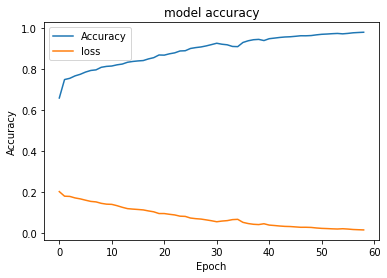

In [105]:
import matplotlib.pyplot as plt
plt.plot(history.history["accuracy"])
plt.plot(history.history['loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Accuracy","loss"])
plt.show()

In [106]:
eval_images=CHUK_images[604:]
eval_labels=CHUK_labels[604:]

In [107]:
eval_labels.shape

(100, 224, 224)

In [ ]:
from keras.models import load_model
from PIL import Image
images = eval_images
model = load_model("sbdn-Exp2_shi-dut_szu_model.h5")
predictions=[]
heatmaps=[]
for i in range(images.shape[0]):
  img = images[i]
  img = img.astype(np.float32)/ 255.0
  img = np.expand_dims(img, -1)
  img = np.expand_dims(img, 0)
  pred = model.predict(img)
  predictions.append(pred)

## **Evaluation with Shi et al (Chuk) Dataset**

In [109]:
ground_truth_total=eval_labels/255.0
ground_truth_total=np.where(ground_truth_total>0.5,1.0,0.0)

## Mean Absolute Error

In [110]:
def get_mae(true_label, y_pred_label):
  absolute_error=[]
  for i in range(0,len(true_label)):
    #true_label = eval_labels[i]/255.0
    pp=np.where(((y_pred_label[i])[0])>0.5,1.0,0.0)
    y_pred=reshape(pp,[224,224])
    y_true=true_label[i]
    mae = tf.keras.losses.MeanAbsoluteError()
    m = mae(y_true, y_pred).numpy()
    absolute_error.append(m)
  return mean(absolute_error)
mean_absolute_error= get_mae(ground_truth_total,predictions)
print('Mean Absolute Error for Evaluation set: ',mean_absolute_error)

Mean Absolute Error for Evaluation set:  0.1468327487244898


## F-measure score

In [111]:
from sklearn.metrics import precision_score,recall_score
threshoulds=[0.3,0.4,0.5,0.6,0.7]
beta2=0.2
def recall_precison(y_true,y_pred):
  OIS_F=[]
  Fb=[]
  for i in range(0,len(y_pred)):
    OIS_F_thr=[]
    fb_thr=[]
    for thr in threshoulds:
      pr=np.where(((y_pred[i])[0])>thr,1.0,0.0)
      pr=reshape(pr,[224,224])
      pred_precision_score=precision_score(y_true[i],pr, average='weighted')
      pred_recall_score=recall_score(y_true[i],pr, average='weighted')
      OIS=2*pred_precision_score*pred_recall_score/(pred_precision_score+pred_recall_score)
      fb=(1+beta2)*pred_precision_score*pred_recall_score/(beta2 * pred_precision_score+pred_recall_score)
      fb_thr.append(fb)
      OIS_F_thr.append(OIS)
    Fb.append(fb_thr)
    OIS_F.append(OIS_F_thr)
  return OIS_F,Fb

In [ ]:
OIS_array,Fb_array=recall_precison(ground_truth_total,predictions)

In [114]:
def Fb_score(Fb_array):
  best_Fb=[]
  for results in Fb_array:
    f_score=max(results)
    best_Fb.append(f_score)
  return np.nanmean(best_Fb)
mean_Fb_score= Fb_score(Fb_array)
print('F-measure score: ',mean_Fb_score)

F-measure score:  0.9154338633026081


predicted Blur Map for 100 test images from chuk


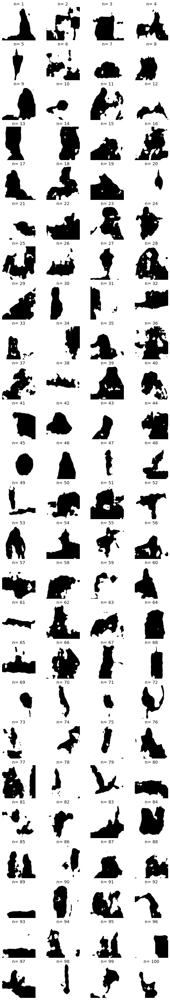

In [116]:
columns = 4
rows = 25
print("predicted Blur Map for 100 test images from chuk")
fig = plt.figure(figsize=(10,60))
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  img_pred_label = np.where(((predictions[i])[0])>0.5,0.1,0.0)
  #img_pred_label=(predictions[i])[0]
  plt.imshow(reshape(img_pred_label*255.0,[224,224]),cmap='gray')
  plt.title(f"n= {i+1}",fontsize=14)
  plt.axis("off")
plt.show()

100 test images from CHUK 


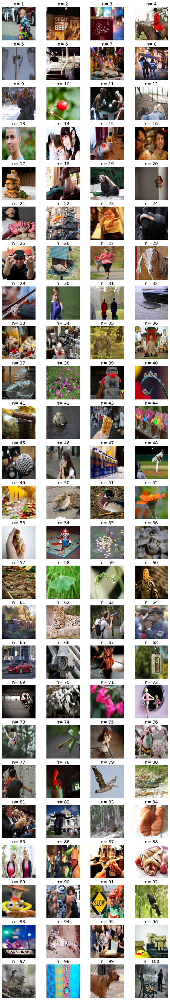

In [117]:
columns = 4
rows = 25
print("100 test images from CHUK ")
fig = plt.figure(figsize=(10,60))
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  plt.imshow(images[i],cmap='binary')
  plt.title(f"n= {i+1}",fontsize=14)
  plt.axis("off")
plt.show()

GT of 100 images from CHUCK


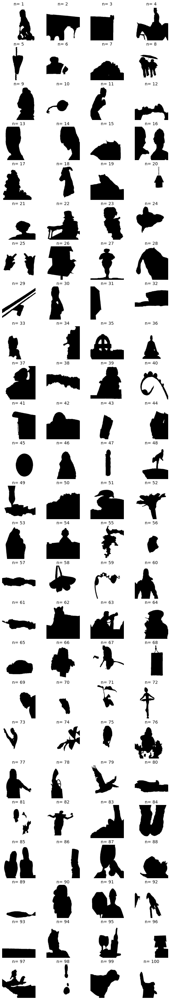

In [118]:
columns = 4
rows = 25
print("GT of 100 images from CHUCK")
fig = plt.figure(figsize=(10,60))
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  plt.imshow(eval_labels[i],cmap='gray')
  plt.title(f"n= {i+1}",fontsize=14)
  plt.axis("off")
plt.show()

## Evaluation with DUT Dataset

In [119]:
!unzip -qq dut500-source.zip

In [120]:
!unzip -qq dut500-gt.zip

In [121]:
images_folder= "dut500-source/*.bmp"
labels_folder = "dut500-gt/"
def data_preprocessing(images_folder,labels_folder):
  total_img = []
  label = []
  files = glob.glob (images_folder)
  for myFile in files:
      image_name=os.path.split(myFile)[1]
      img = Image.open(myFile)
      new_img = img.resize( (224, 224))
      image = array(new_img)
      new_label=Image.open(labels_folder+image_name)
      new_label = new_label.resize((224, 224))
      label_image = array(new_label)
      label.append (label_image)
      total_img.append (image)
  total_img = np.array(total_img)
  label = np.array(label)
  label= np.reshape(label,[label.shape[0],label.shape[1],label.shape[2]])
  total_img= np.reshape(total_img,[total_img.shape[0],total_img.shape[1],total_img.shape[2],total_img.shape[3]])
  return label,total_img

In [122]:
DUT_labels,DUT_images=data_preprocessing(images_folder,labels_folder)

In [123]:
DUT_images.shape

(500, 224, 224, 3)

In [124]:
DUT_labels.shape

(500, 224, 224)

In [ ]:
images = DUT_images
predictions=[]
for i in range(images.shape[0]):
  img = images[i]
  img = img.astype(np.float32)/ 255.0
  img = np.expand_dims(img, -1)
  img = np.expand_dims(img, 0)
  pred = model.predict(img)
  predictions.append(pred)

In [126]:
ground_truth_total=DUT_labels/255.0
ground_truth_total=np.where(ground_truth_total>0.5,0.0,1.0)

In [127]:
def get_mae(true_label, y_pred_label):
  absolute_error=[]
  for i in range(0,len(true_label)):
    #true_label = eval_labels[i]/255.0
    pp=np.where(((y_pred_label[i])[0])>0.5,1.0,0.0)
    y_pred=reshape(pp,[224,224])
    y_true=true_label[i]
    mae = tf.keras.losses.MeanAbsoluteError()
    m = mae(y_true, y_pred).numpy()
    absolute_error.append(m)
  return mean(absolute_error)
mean_absolute_error= get_mae(ground_truth_total,predictions)
print('Mean Absolute Error for Evaluation set: ',mean_absolute_error)

Mean Absolute Error for Evaluation set:  0.1397130899234694


In [128]:
from sklearn.metrics import precision_score,recall_score
threshoulds=[0.3,0.4,0.5,0.6,0.7]
beta2=0.2
def recall_precison(y_true,y_pred):
  OIS_F=[]
  Fb=[]
  for i in range(0,len(y_pred)):
    OIS_F_thr=[]
    fb_thr=[]
    for thr in threshoulds:
      pr=np.where(((y_pred[i])[0])>thr,1.0,0.0)
      pr=reshape(pr,[224,224])
      pred_precision_score=precision_score(y_true[i],pr, average='weighted')
      pred_recall_score=recall_score(y_true[i],pr, average='weighted')
      OIS=2*pred_precision_score*pred_recall_score/(pred_precision_score+pred_recall_score)
      fb=(1+beta2)*pred_precision_score*pred_recall_score/(beta2 * pred_precision_score+pred_recall_score)
      fb_thr.append(fb)
      OIS_F_thr.append(OIS)
    Fb.append(fb_thr)
    OIS_F.append(OIS_F_thr)
  return OIS_F,Fb

In [ ]:
OIS_array,Fb_array=recall_precison(ground_truth_total,predictions)

In [130]:
def Fb_score(Fb_array):
  best_Fb=[]
  for results in Fb_array:
    f_score=max(results)
    best_Fb.append(f_score)
  return np.nanmean(best_Fb)
mean_Fb_score= Fb_score(Fb_array)
print('F-measure score: ',mean_Fb_score)

F-measure score:  0.9104774677903563


In [131]:
def OIS_F_score(OIS_array):
  best_OIS_F=[]
  index_max=[]
  for results in OIS_array:
    f_score=max(results)
    best_OIS_F.append(f_score)
    index = results.index(f_score)
    index_max.append(index)
  return best_OIS_F,index_max
OIS_f1,indexes=OIS_F_score(OIS_array)
print('Average Optimal Image Scale F score: ',np.nanmean(OIS_f1))

Average Optimal Image Scale F score:  0.9181795780558429


predicted Blur Map for 500 test images from DUT


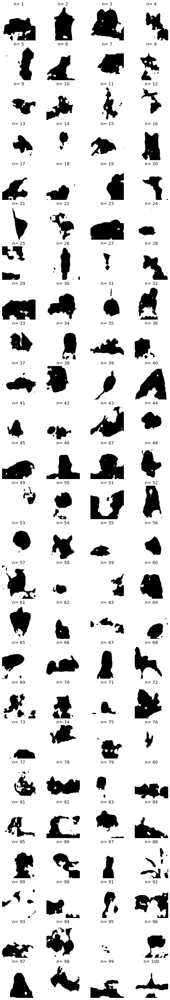

In [132]:
columns = 4
rows = 25
print("predicted Blur Map for 500 test images from DUT")
fig = plt.figure(figsize=(10,60))
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  img_pred_label = np.where(((predictions[i])[0])>0.5,0.1,0.0)
  #img_pred_label=(predictions[i])[0]
  plt.imshow(reshape(img_pred_label*255.0,[224,224]),cmap='gray')
  plt.title(f"n= {i+1}",fontsize=14)
  plt.axis("off")
plt.show()

100 test images from DUT 


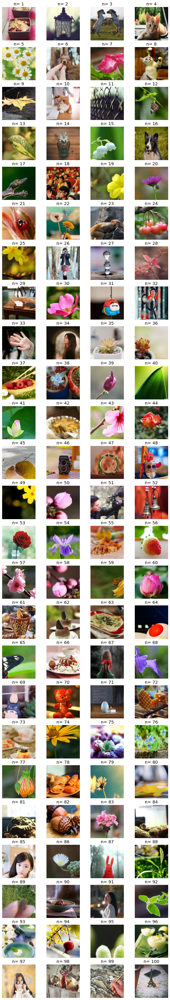

In [133]:
columns = 4
rows = 25
print("100 test images from DUT ")
fig = plt.figure(figsize=(10,60))
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  plt.imshow(images[i],cmap='binary')
  plt.title(f"n= {i+1}",fontsize=14)
  plt.axis("off")
plt.show()

GT of 100 images from DUT


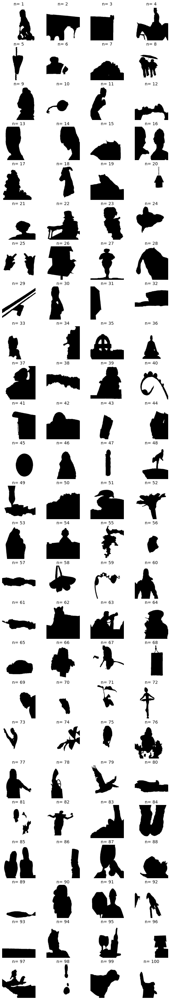

In [134]:
columns = 4
rows = 25
print("GT of 100 images from DUT")
fig = plt.figure(figsize=(10,60))
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  plt.imshow(eval_labels[i],cmap='gray')
  plt.title(f"n= {i+1}",fontsize=14)
  plt.axis("off")
plt.show()

## Evaluation with SZU-DB Dataset

In [135]:
!unzip -qq SZU-img.zip

In [136]:
!unzip -qq SZU-gt.zip

In [137]:
from numpy import *
images_folder= "SZU-img/*.jpg"
labels_folder = "SZU-gt/"
def data_preprocessing(images_folder,labels_folder):
  total_img = []
  label = []
  files = glob.glob (images_folder)
  for myFile in files:
      image_name=os.path.split(myFile)[1]
      img = Image.open(myFile)
      img = img.resize( (224, 224))
      image= np.asarray(img)
      image_name=image_name[:-3]
      image_name=image_name+'png'
      new_label=Image.open(labels_folder+image_name)
      new_label = new_label.resize((224, 224))
      label_image = array(new_label)
      label.append (label_image)
      total_img.append (image)
  total_img = np.array(total_img)
  label = np.array(label)
  label= np.reshape(label,[label.shape[0],label.shape[1],label.shape[2]])
  total_img= np.reshape(total_img,[total_img.shape[0],total_img.shape[1],total_img.shape[2],total_img.shape[3]])
  return label,total_img

In [138]:
SZU_labels,SZU_images=data_preprocessing(images_folder,labels_folder)

In [139]:
SZU_images.shape

(784, 224, 224, 3)

In [140]:
SZU_labels.shape

(784, 224, 224)

In [ ]:
images = SZU_images
predictions=[]
for i in range(images.shape[0]):
  img = images[i]
  img = img.astype(np.float32)/ 255.0
  img = np.expand_dims(img, -1)
  img = np.expand_dims(img, 0)
  pred = model.predict(img)
  predictions.append(pred)

In [142]:
ground_truth_total=SZU_labels/255.0
ground_truth_total=np.where(ground_truth_total>0.5,1.0,0.0)

In [143]:
def get_mae(true_label, y_pred_label):
  absolute_error=[]
  for i in range(0,len(true_label)):
    #true_label = eval_labels[i]/255.0
    pp=np.where(((y_pred_label[i])[0])>0.5,1.0,0.0)
    y_pred=reshape(pp,[224,224])
    y_true=true_label[i]
    mae = tf.keras.losses.MeanAbsoluteError()
    m = mae(y_true, y_pred).numpy()
    absolute_error.append(m)
  return mean(absolute_error)
mean_absolute_error= get_mae(ground_truth_total,predictions)
print('Mean Absolute Error for Evaluation set: ',mean_absolute_error)

Mean Absolute Error for Evaluation set:  0.11291661514733445


In [144]:
from sklearn.metrics import precision_score,recall_score
threshoulds=[0.3,0.4,0.5,0.6,0.7]
beta2=0.2
def recall_precison(y_true,y_pred):
  OIS_F=[]
  Fb=[]
  for i in range(0,len(y_pred)):
    OIS_F_thr=[]
    fb_thr=[]
    for thr in threshoulds:
      pr=np.where(((y_pred[i])[0])>thr,1.0,0.0)
      pr=reshape(pr,[224,224])
      pred_precision_score=precision_score(y_true[i],pr, average='weighted')
      pred_recall_score=recall_score(y_true[i],pr, average='weighted')
      OIS=2*pred_precision_score*pred_recall_score/(pred_precision_score+pred_recall_score)
      fb=(1+beta2)*pred_precision_score*pred_recall_score/(beta2 * pred_precision_score+pred_recall_score)
      fb_thr.append(fb)
      OIS_F_thr.append(OIS)
    Fb.append(fb_thr)
    OIS_F.append(OIS_F_thr)
  return OIS_F,Fb

In [ ]:
OIS_array,Fb_array=recall_precison(ground_truth_total,predictions)

In [146]:
def Fb_score(Fb_array):
  best_Fb=[]
  for results in Fb_array:
    f_score=max(results)
    best_Fb.append(f_score)
  return np.nanmean(best_Fb)
mean_Fb_score= Fb_score(Fb_array)
print('Fb score: ',mean_Fb_score)

Fb score:  0.9483063520782123


In [147]:
def OIS_F_score(OIS_array):
  best_OIS_F=[]
  index_max=[]
  for results in OIS_array:
    f_score=max(results)
    best_OIS_F.append(f_score)
    index = results.index(f_score)
    index_max.append(index)
  return best_OIS_F,index_max
OIS_f1,indexes=OIS_F_score(OIS_array)
print('Average Optimal Image Scale F score: ',np.nanmean(OIS_f1))

Average Optimal Image Scale F score:  0.9298047568459923


predicted Blur Map for 784 test images from SZU


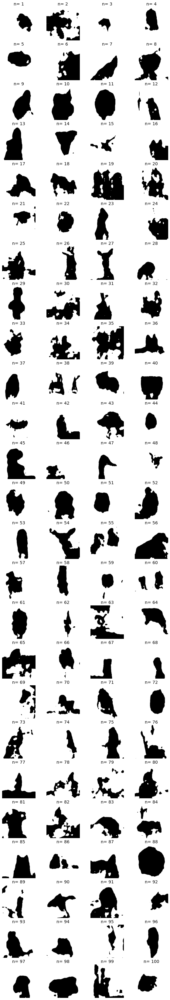

In [149]:
columns = 4
rows = 25
print("predicted Blur Map for 784 test images from SZU")
fig = plt.figure(figsize=(10,60))
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  img_pred_label = np.where(((predictions[i])[0])>0.5,0.1,0.0)
  #img_pred_label=(predictions[i])[0]
  plt.imshow(reshape(img_pred_label*255.0,[224,224]),cmap='gray')
  plt.title(f"n= {i+1}",fontsize=14)
  plt.axis("off")
plt.show()

100 test images from SZU 


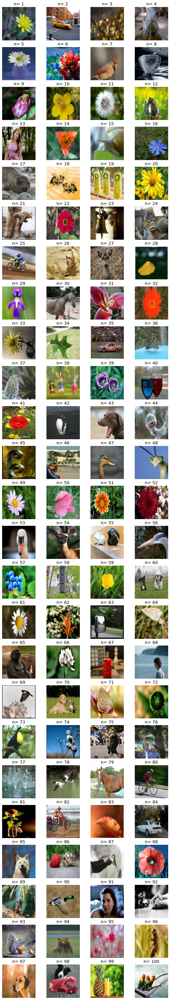

In [151]:
columns = 4
rows = 25
print("100 test images from SZU ")
fig = plt.figure(figsize=(10,60))
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  plt.imshow(images[i],cmap='binary')
  plt.title(f"n= {i+1}",fontsize=14)
  plt.axis("off")
plt.show()

GT of 100 images from SZU


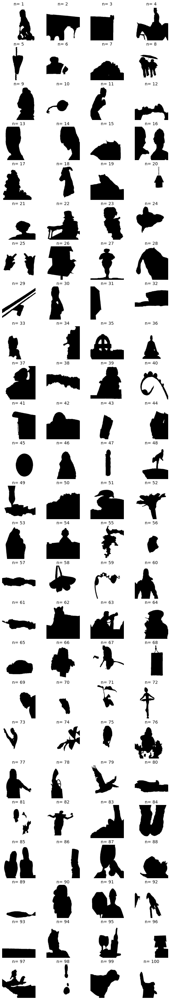

In [152]:
columns = 4
rows = 25
print("GT of 100 images from SZU")
fig = plt.figure(figsize=(10,60))
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  plt.imshow(eval_labels[i],cmap='gray')
  plt.title(f"n= {i+1}",fontsize=14)
  plt.axis("off")
plt.show()